## Segmentation d'images

<img src="mySaves/other_images/logo_future_vision_transport.png" alt="logo_future_vision_transport" width="400" class="center"/>

# Scrips

## I. Imports

In [1]:
# imports

import tensorflow as tf
import keras
%env SM_FRAMEWORK=tf.keras
import segmentation_models as sm

import albumentations as A

import os

import numpy as np

import matplotlib.pyplot as plt

import myFunction as mf
%load_ext autoreload
    
%autoreload 2

import time

import pandas as pd

from joblib import dump, load


env: SM_FRAMEWORK=tf.keras
Segmentation Models: using `tf.keras` framework.


In [ ]:
# for requierements.txt
# pipreqs --force --ignore Patin_Clement_2_API_042024, Patin_Clement_3_application_Flask_042024  --scan-notebooks

In [2]:
# create folder for saving
if not os.path.isdir("mySaves"):
    os.mkdir("mySaves")

## II. Accéder au dataset des images : Data Generator

Définir le dictionnaire pour passer de 32 à 8 catégories :

In [3]:
cats = {'void': [0, 1, 2, 3, 4, 5, 6],
 'flat': [7, 8, 9, 10],
 'construction': [11, 12, 13, 14, 15, 16],
 'object': [17, 18, 19, 20],
 'nature': [21, 22],
 'sky': [23],
 'human': [24, 25],
 'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]}

Définir un mapping pour de couleur pour ces classes :

In [4]:
cats_colors = np.array([
        [0, 0, 0],
        [128, 64,128],
        [70, 70, 70],
        [153,153,153],
        [107,142, 35],
        [70,130,180],
        [220, 20, 60],
        [0,  0,142]
])

Utilisation de la classe `generator` :

In [5]:
# define shared "random_state" for creating the validation and test generators
same_random_state = 16
same_test_size = 0.3

# define shared "batch_size"
batch_size = 32

In [6]:
# use custom class "generator"

# no backbone, no augmentation
train_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    n_images=512,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=True
)


valid_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_train",
    split_rs=same_random_state
)


test_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_test",
    split_rs=same_random_state
)




# Model UNET Mini, notre baseline

In [7]:
input_shape = train_gen[0][0][0].shape
classes = len(cats)
activation = "softmax"
learning_rate = 0.001
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125]))
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

jaccard = sm.metrics.IOUScore(threshold=0.5)
dice = sm.metrics.FScore()
metrics = [jaccard, dice]


baseline = mf.baseline_model(input_shape=input_shape, num_classes=classes)

baseline.compile(
    optimizer=optimizer,
    loss=total_loss,
    metrics=metrics
)

baseline.summary()





Model: "baseline_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 512, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 512, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 256, 64)      0         
 D)                                                              
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 256, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 128, 256, 128)     147584    
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 64, 128, 128)      0         
 g2D)                                             

In [8]:
# create folder for saving
if not os.path.isdir("mySaves/models"):
    os.mkdir("mySaves/models")

In [9]:
results = pd.DataFrame(columns=["model", "backbone", "loss_fcuntion", "val_iou", "val_f_score", "training_time", "augmentation"])

In [10]:
reboot = False
continue_fitting = False

In [11]:

if ("baseline.h5" in os.listdir("mySaves/models")) and reboot == False :
    baseline.load_weights("mySaves/models/baseline.h5")
    training_time = load("mySaves/training_times/baseline_training_time.joblib")

if ("baseline.h5" not in os.listdir("mySaves/models")) or (reboot == True) or (continue_fitting == True) :

   # define callback
   callbacks = [
      keras.callbacks.EarlyStopping(monitor="val_iou_score", patience=3, mode="max", restore_best_weights=True, start_from_epoch=10)
   ]

   start = time.time()

   baseline.fit(
        x=train_gen,
        steps_per_epoch=len(train_gen),
        epochs=100,
        validation_data=valid_gen,
        callbacks=callbacks
    )
   
   training_time = time.time() - start
   
   baseline.save_weights("mySaves/models/baseline.h5")
   dump(training_time,"mySaves/training_times/baseline_training_time.joblib")



In [12]:
scores = baseline.evaluate(valid_gen)



2/2 [==============================] - 20s 9s/step - loss: 0.9776 - iou_score: 0.3879 - f1-score: 0.4902


In [13]:
new_results = ["baseline", "", "dice+focal"] + scores[1:] + [training_time, "No"]
results.loc[results.shape[0],:] =  new_results
results

,model,backbone,loss_fcuntion,val_iou,val_f_score,training_time,augmentation
0,baseline,,dice+focal,0.387861,0.490223,15553.263523,No


1/1 [==============================] - 0s 457ms/step
(256, 512, 8)
(256, 512, 3)


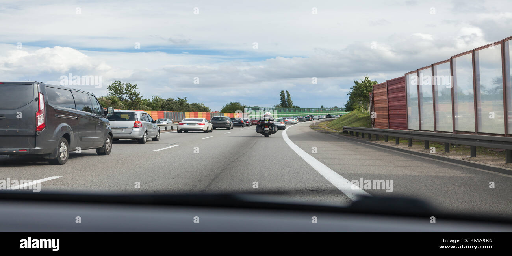

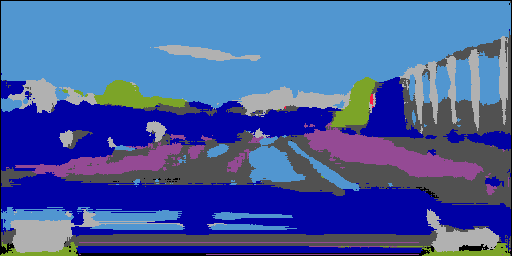

In [14]:
perso = keras.preprocessing.image.load_img("photo-prise-de-l-interieur-de-la-voiture-a-la-route-2e3kacw.jpg",target_size=(256,512))

perso = keras.preprocessing.image.img_to_array(perso)

perso_pred = baseline.predict(np.array([perso]))[0]

print(perso_pred.shape)

perso_pred = cats_colors[np.argmax(perso_pred, axis=2)]

print(perso_pred.shape)

display(keras.preprocessing.image.array_to_img(perso))
display(keras.preprocessing.image.array_to_img(perso_pred))

1/1 [==============================] - 2s 2s/step


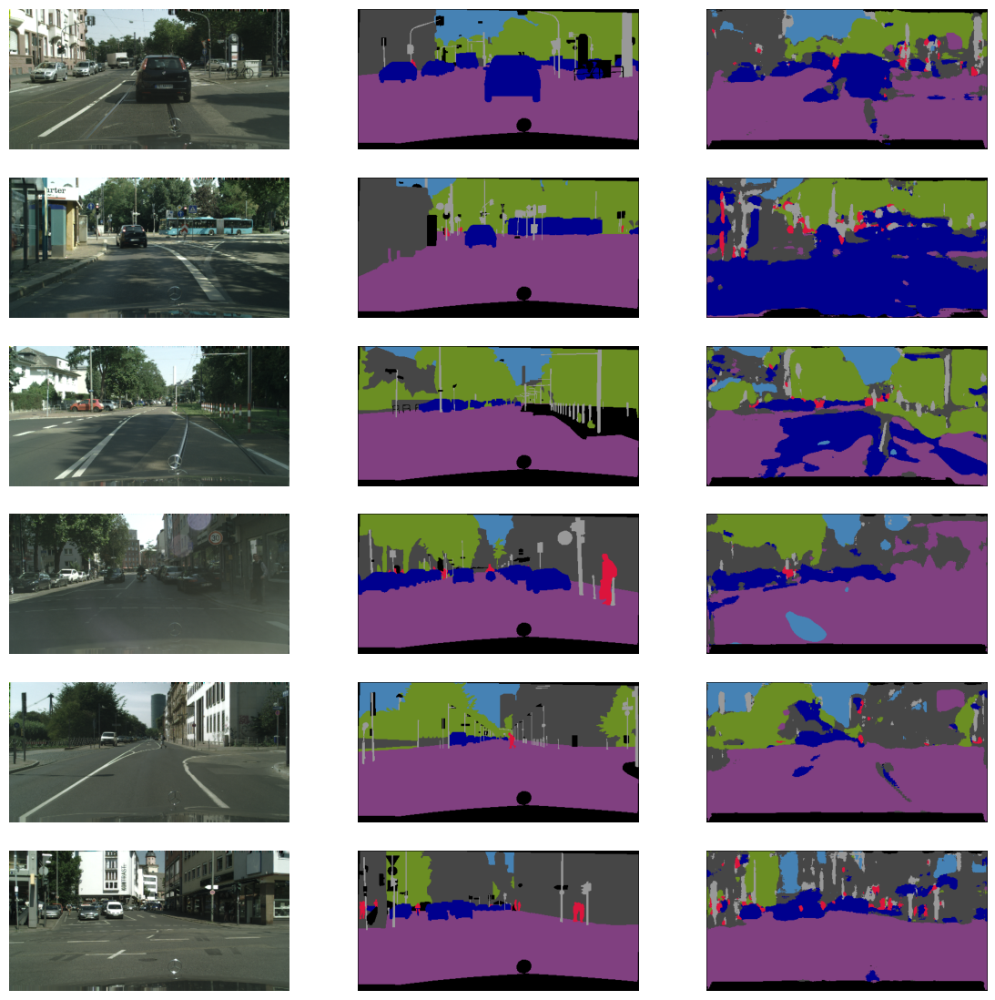

In [15]:
mf.testModel(model=baseline, test_gen=test_gen, n_images=6, cats_colors=cats_colors, random_state=16)

In [16]:
del baseline
import gc
gc.collect()

38096

# Comparaison de deux modèles - **Resnet34** vs **VGG16**

## Resnet34

In [17]:
# use custom class "generator"

# backbone
backbone_name = 'resnet34'

# without augmentations for training
train_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    n_images=512,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=True
)

valid_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_train",
    split_rs=same_random_state
)


test_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_test",
    split_rs=same_random_state
)


In [18]:
len(test_gen)

1

In [19]:
input_shape = train_gen[0][0][0].shape
classes = len(cats)
activation = "softmax"
learning_rate = 0.001
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125]))
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

jaccard = sm.metrics.IOUScore(threshold=0.5)
dice = sm.metrics.FScore()
metrics = [jaccard, dice]


unet_resnet34 = sm.Unet(
    backbone_name=backbone_name,
    input_shape=input_shape,
    classes=classes,
    activation=activation, 
    encoder_weights='imagenet'
)

unet_resnet34.compile(
    optimizer=optimizer,
    loss=total_loss,
    metrics=metrics
)

unet_resnet34.summary()



Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 256, 512, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 256, 512, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 262, 518, 3)          0         ['bn_data[0][0]']             
 g2D)                                                                                             
                                                                                            

In [20]:
reboot = False
continue_fitting = False

In [21]:

if ("resnet34.h5" in os.listdir("mySaves/models")) and reboot == False :
    unet_resnet34.load_weights("mySaves/models/resnet34.h5")
    training_time = load("mySaves/training_times/resnet34_training_time.joblib")

if ("resnet34.h5" not in os.listdir("mySaves/models")) or (reboot == True) or (continue_fitting == True) :

   # define callback
   callbacks = [
      keras.callbacks.EarlyStopping(monitor="val_iou_score", patience=3, mode="max", restore_best_weights=True, start_from_epoch=10)
   ]

   start = time.time()

   unet_resnet34.fit(
        x=train_gen,
        steps_per_epoch=len(train_gen),
        epochs=100,
        validation_data=valid_gen,
        callbacks=callbacks
    )
   
   training_time = time.time() - start
   
   unet_resnet34.save_weights("mySaves/models/resnet34.h5")
   dump(training_time,"mySaves/training_times/resnet34_training_time.joblib")



In [22]:
scores = unet_resnet34.evaluate(valid_gen)

2/2 [==============================] - 11s 4s/step - loss: 0.9247 - iou_score: 0.6572 - f1-score: 0.7023


In [23]:
new_results = ["unet", "resnet34", "dice+focal"] + scores[1:] + [training_time, "No"]
results.loc[results.shape[0],:] =  new_results
results

,model,backbone,loss_fcuntion,val_iou,val_f_score,training_time,augmentation
0,baseline,,dice+focal,0.387861,0.490223,15553.263523,No
1,unet,resnet34,dice+focal,0.657187,0.7023,4784.311546,No


1/1 [==============================] - 1s 777ms/step
(256, 512, 8)
(256, 512, 3)


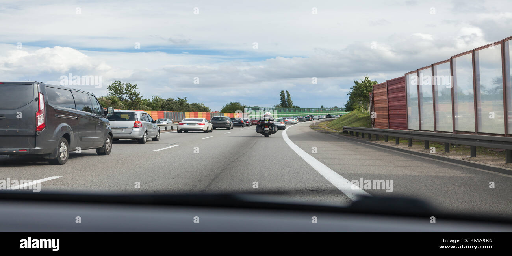

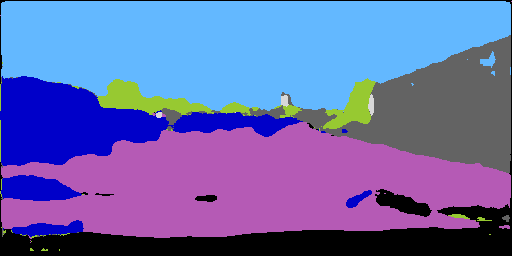

In [24]:
perso = keras.preprocessing.image.load_img("photo-prise-de-l-interieur-de-la-voiture-a-la-route-2e3kacw.jpg",target_size=(256,512))

perso = keras.preprocessing.image.img_to_array(perso)

perso = sm.get_preprocessing(backbone_name)(perso)

perso_pred = unet_resnet34.predict(np.array([perso]))[0]

print(perso_pred.shape)

perso_pred = cats_colors[np.argmax(perso_pred, axis=2)]

print(perso_pred.shape)

display(keras.preprocessing.image.array_to_img(perso))
display(keras.preprocessing.image.array_to_img(perso_pred))

1/1 [==============================] - 1s 1s/step


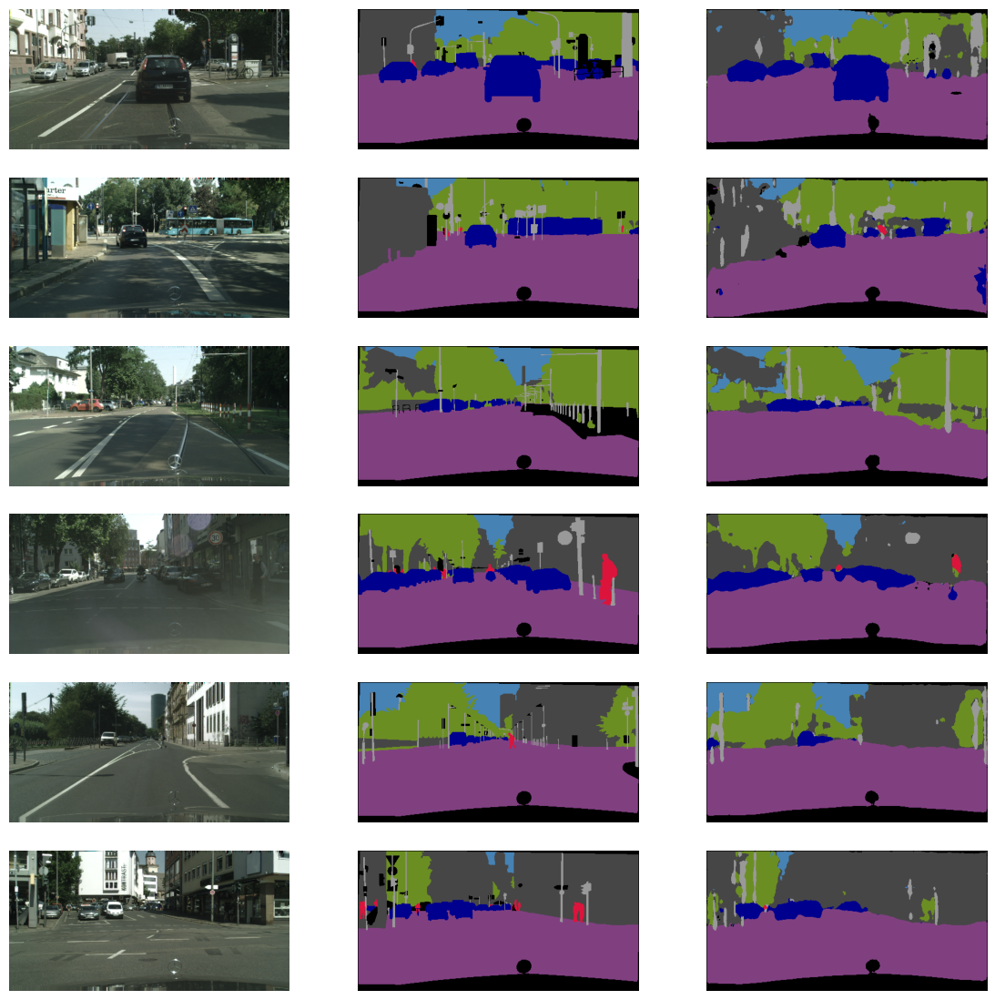

In [25]:
mf.testModel(model=unet_resnet34, test_gen=test_gen, n_images=6, cats_colors=cats_colors, random_state=16)

In [26]:
del unet_resnet34
import gc
gc.collect()

72119

## VGG16

In [27]:
# use custom class "generator"

# backbone
backbone_name = 'vgg16'

# with augmentations for training
train_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    n_images=512,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=True
)

valid_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_train",
    split_rs=same_random_state
)


test_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_test",
    split_rs=same_random_state
)

In [28]:
input_shape = train_gen[0][0][0].shape
classes = len(cats)
activation = "softmax"
learning_rate = 0.001
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125]))
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

jaccard = sm.metrics.IOUScore(threshold=0.5)
dice = sm.metrics.FScore()
metrics = [jaccard, dice]


unet_vgg16 = sm.Unet(
    backbone_name=backbone_name,
    input_shape=input_shape,
    classes=classes,
    activation=activation,
)

unet_vgg16.compile(
    optimizer=optimizer,
    loss=total_loss,
    metrics=metrics
)

unet_vgg16.summary()



Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 512, 3)]        0         []                            
                                                                                                  
 block1_conv1 (Conv2D)       (None, 256, 512, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 block1_conv2 (Conv2D)       (None, 256, 512, 64)         36928     ['block1_conv1[0][0]']        
                                                                                                  
 block1_pool (MaxPooling2D)  (None, 128, 256, 64)         0         ['block1_conv2[0][0]']        
                                                                                            

In [29]:
reboot = False
continue_fitting = False

In [30]:

if ("vgg16.h5" in os.listdir("mySaves/models")) and reboot == False :
    unet_vgg16.load_weights("mySaves/models/vgg16.h5")
    training_time = load("mySaves/training_times/vgg16_training_time.joblib")

if ("vgg16.h5" not in os.listdir("mySaves/models")) or (reboot == True) or (continue_fitting == True) :

   # define callback
   callbacks = [
      keras.callbacks.EarlyStopping(monitor="val_iou_score", patience=3, mode="max", restore_best_weights=True, start_from_epoch=10)
   ]

   start = time.time()

   unet_vgg16.fit(
        x=train_gen,
        steps_per_epoch=len(train_gen),
        epochs=100,
        validation_data=valid_gen,
        callbacks=callbacks
    )
   
   training_time = time.time() - start
   
   unet_vgg16.save_weights("mySaves/models/vgg16.h5")
   dump(training_time,"mySaves/training_times/vgg16_training_time.joblib")




In [31]:
scores = unet_vgg16.evaluate(valid_gen)

2/2 [==============================] - 20s 9s/step - loss: 0.9837 - iou_score: 0.3018 - f1-score: 0.3473


In [32]:
new_results = ["unet", "vgg16", "dice+focal"] + scores[1:] + [training_time, "No"]
results.loc[results.shape[0],:] =  new_results
results

,model,backbone,loss_fcuntion,val_iou,val_f_score,training_time,augmentation
0,baseline,,dice+focal,0.387861,0.490223,15553.263523,No
1,unet,resnet34,dice+focal,0.657187,0.7023,4784.311546,No
2,unet,vgg16,dice+focal,0.301794,0.347305,10787.407295,No


1/1 [==============================] - 1s 618ms/step
(256, 512, 8)
(256, 512, 3)


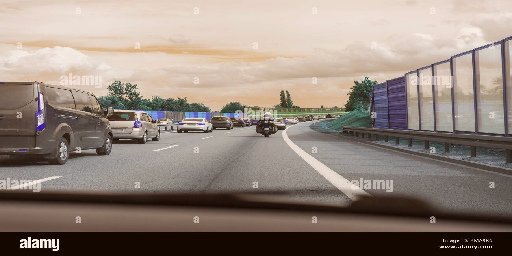

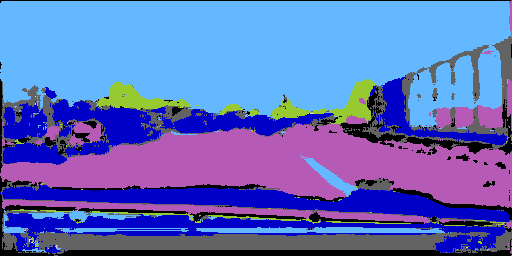

In [33]:
perso = keras.preprocessing.image.load_img("photo-prise-de-l-interieur-de-la-voiture-a-la-route-2e3kacw.jpg",target_size=(256,512))

perso = keras.preprocessing.image.img_to_array(perso)

perso = sm.get_preprocessing(backbone_name)(perso)

perso_pred = unet_vgg16.predict(np.array([perso]))[0]

print(perso_pred.shape)

perso_pred = cats_colors[np.argmax(perso_pred, axis=2)]

print(perso_pred.shape)

display(keras.preprocessing.image.array_to_img(perso))
display(keras.preprocessing.image.array_to_img(perso_pred))

1/1 [==============================] - 2s 2s/step


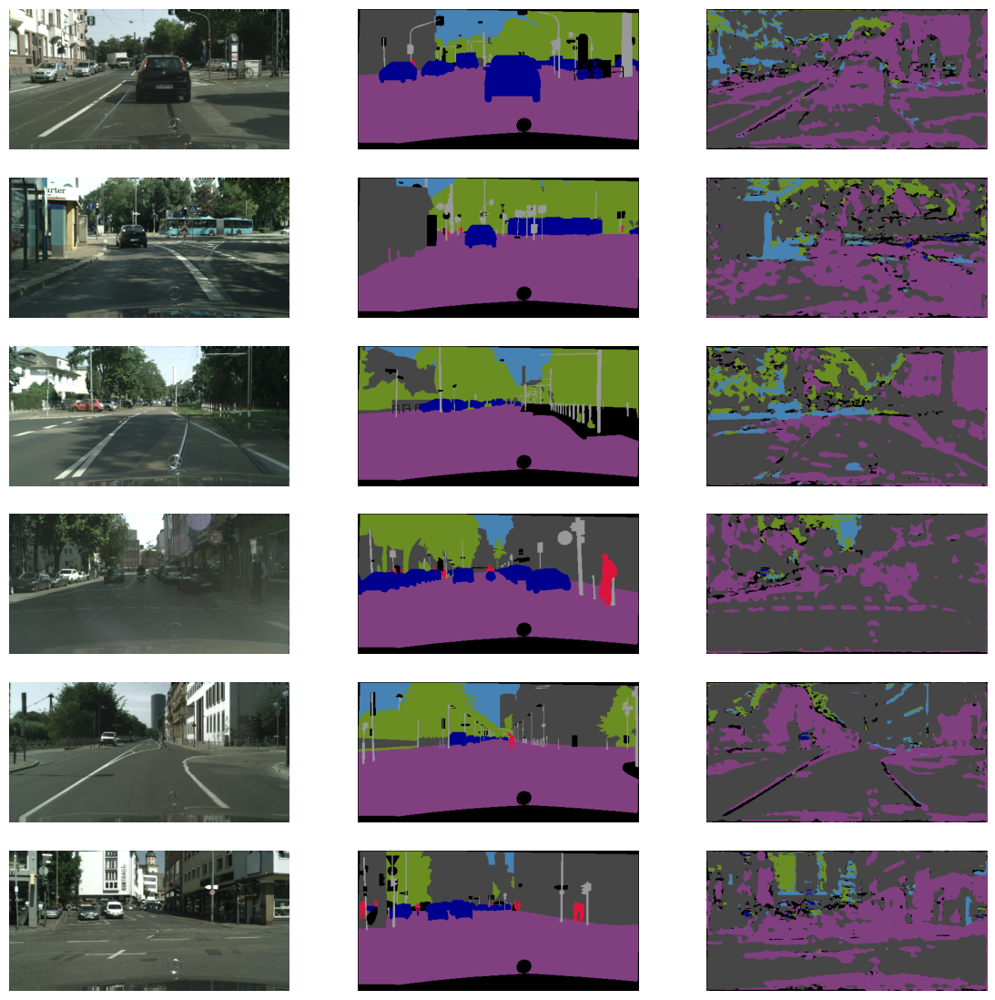

In [34]:
mf.testModel(model=unet_vgg16, test_gen=test_gen, n_images=6, cats_colors=cats_colors, random_state=16)

In [35]:
del unet_vgg16
import gc
gc.collect()

48359

# Data Augmentation

Liste de transformations pour l'augmentation de données :

In [36]:
# define augmentations for training
list_of_transforms = [
    A.OneOf(
        [
            A.FancyPCA(p=1, alpha=1),
            A.HueSaturationValue(p=1, hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20),
            A.ColorJitter(p=1, brightness=0.2, contrast=0.2, saturation=0.2),
        ],
        p=0.5
    ),
    A.RandomShadow(
        p=0.5, 
        shadow_roi=(
            0, 0.4,
            1, 1
            ), 
        num_shadows_lower=1, 
        num_shadows_upper=4, 
        shadow_dimension=5
        ),
    A.CoarseDropout(
        p=0.5, 
        min_holes=2, 
        max_holes=8, 
        min_height=0.05, 
        max_height=0.1, 
        min_width=0.025, 
        max_width=0.05
        )
]

    


In [37]:
# use custom class "generator"

# backbone
backbone_name = 'resnet34'

# WITH augmentations for training
train_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    n_images=512,
    cats=cats,
    backbone = backbone_name,
    augmentation=A.Compose(list_of_transforms),
    shuffle=True
)

valid_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_train",
    split_rs=same_random_state
)


test_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=128,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_test",
    split_rs=same_random_state
)


In [38]:
input_shape = train_gen[0][0][0].shape
classes = len(cats)
activation = "softmax"
learning_rate = 0.001
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125, 0.125]))
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

jaccard = sm.metrics.IOUScore(threshold=0.5)
dice = sm.metrics.FScore()
metrics = [jaccard, dice]


unet_resnet34_aug = sm.Unet(
    backbone_name=backbone_name,
    input_shape=input_shape,
    classes=classes,
    activation=activation
)

unet_resnet34_aug.compile(
    optimizer=optimizer,
    loss=total_loss,
    metrics=metrics
)

unet_resnet34_aug.summary()



Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 256, 512, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 256, 512, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d_34 (ZeroPad  (None, 262, 518, 3)          0         ['bn_data[0][0]']             
 ding2D)                                                                                          
                                                                                            

In [39]:
reboot = False
continue_fitting = False

In [40]:

if ("resnet34_aug.h5" in os.listdir("mySaves/models")) and reboot == False :
    unet_resnet34_aug.load_weights("mySaves/models/resnet34_aug.h5")
    training_time = load("mySaves/training_times/resnet34_aug_training_time.joblib")

if ("resnet34_aug.h5" not in os.listdir("mySaves/models")) or (reboot == True) or (continue_fitting == True) :

   # define callback
   callbacks = [
      keras.callbacks.EarlyStopping(monitor="val_iou_score", patience=3, mode="max", restore_best_weights=True, start_from_epoch=10)
   ]

   start = time.time()
   
   unet_resnet34_aug.fit(
        x=train_gen,
        steps_per_epoch=len(train_gen),
        epochs=100,
        validation_data=valid_gen,
        callbacks=callbacks
    )
   
   training_time = time.time() - start
   
   unet_resnet34_aug.save_weights("mySaves/models/resnet34_aug.h5")
   dump(training_time,"mySaves/training_times/resnet34_aug_training_time.joblib")



In [41]:
scores = unet_resnet34_aug.evaluate(valid_gen)

2/2 [==============================] - 10s 4s/step - loss: 0.9239 - iou_score: 0.6575 - f1-score: 0.7216


In [42]:
new_results = ["unet", "resnet34", "dice+focal"] + scores[1:] + [training_time, "Yes"]
results.loc[results.shape[0],:] =  new_results
results

,model,backbone,loss_fcuntion,val_iou,val_f_score,training_time,augmentation
0,baseline,,dice+focal,0.387861,0.490223,15553.263523,No
1,unet,resnet34,dice+focal,0.657187,0.7023,4784.311546,No
2,unet,vgg16,dice+focal,0.301794,0.347305,10787.407295,No
3,unet,resnet34,dice+focal,0.657511,0.721638,9438.153805,Yes


1/1 [==============================] - 1s 793ms/step
(256, 512, 8)
(256, 512, 3)


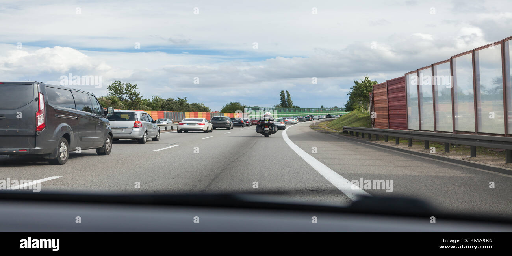

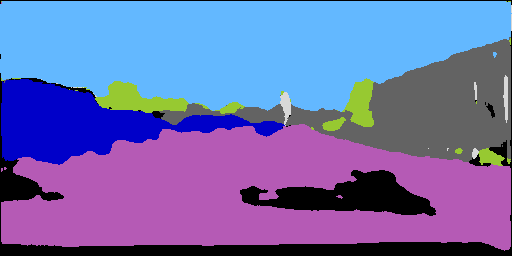

In [43]:
perso = keras.preprocessing.image.load_img("photo-prise-de-l-interieur-de-la-voiture-a-la-route-2e3kacw.jpg",target_size=(256,512))

perso = keras.preprocessing.image.img_to_array(perso)

perso = sm.get_preprocessing(backbone_name)(perso)

perso_pred = unet_resnet34_aug.predict(np.array([perso]))[0]

print(perso_pred.shape)

perso_pred = cats_colors[np.argmax(perso_pred, axis=2)]

print(perso_pred.shape)

display(keras.preprocessing.image.array_to_img(perso))
display(keras.preprocessing.image.array_to_img(perso_pred))

1/1 [==============================] - 1s 1s/step


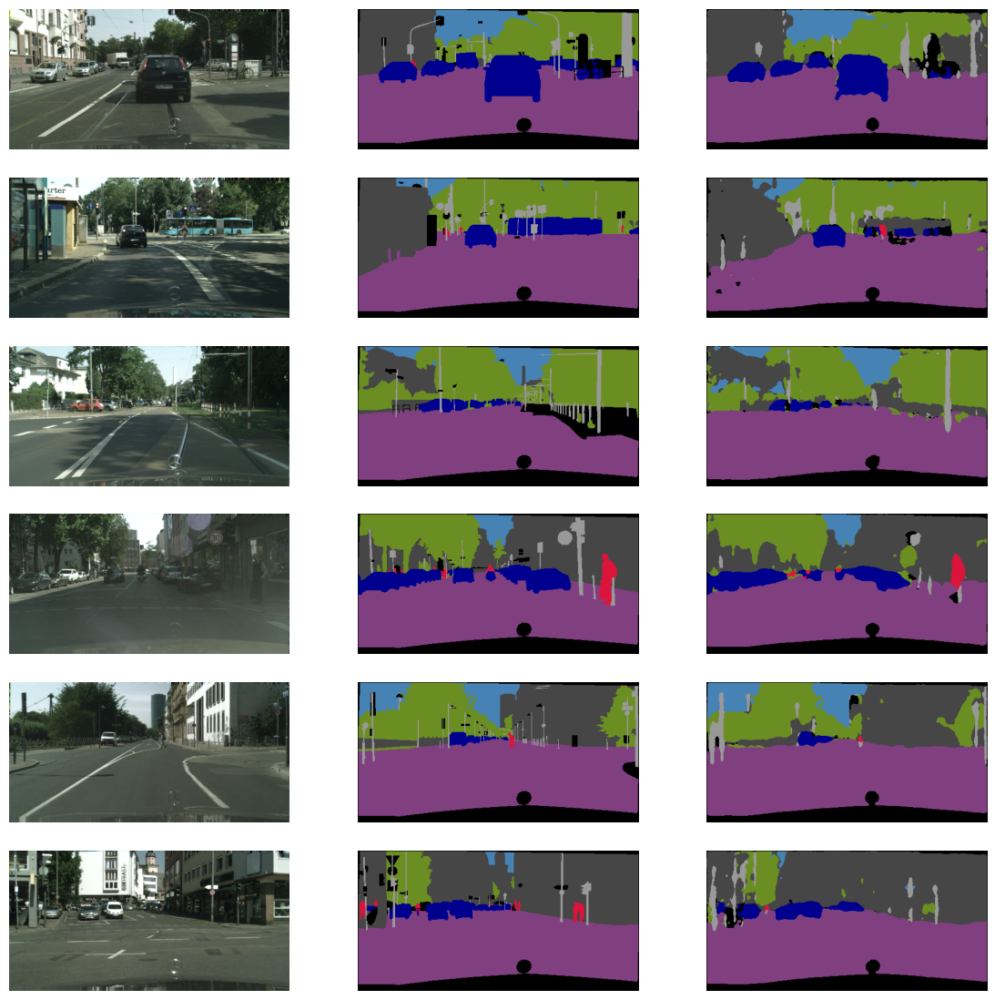

In [44]:
mf.testModel(model=unet_resnet34_aug, test_gen=test_gen, n_images=6, cats_colors=cats_colors, random_state=16)

# Améliorer l'hyperparamètre "fonction de perte"

Détermination du `IoU` **par classe** :

In [45]:
# initiate our MeanIoU
MeanIoU = keras.metrics.MeanIoU(num_classes=len(cats))
# prediction on validation set
y_pred = np.argmax(
    unet_resnet34_aug.predict(valid_gen), 
    axis=-1
    )
# test masks
y_true = np.argmax(
    np.vstack(
        [valid_gen[i][1] for i in range(len(valid_gen))]
        ),
        axis=-1
        )

# compute IoU
MeanIoU.update_state(y_true=y_true, y_pred=y_pred)

# compute IoU for each class
IoU_values = MeanIoU.get_weights()[0]

IoU_classes = IoU_values.diagonal()/IoU_values.sum(axis=1)

# put results in a dataframe
IoU_tab = pd.DataFrame(index=range(len(cats)))

IoU_tab["macro_cats"] = list(cats.keys())

IoU_tab["IoU_classes"] = IoU_classes

IoU_tab

2/2 [==============================] - 10s 4s/step


,macro_cats,IoU_classes
0,void,0.765797
1,flat,0.975609
2,construction,0.921315
3,object,0.358531
4,nature,0.853648
5,sky,0.924944
6,human,0.505805
7,vehicle,0.715172


Maintenant nous pouvons tester d'autres paramètres pour l'argument `class_weight` de la fonction de perte `DiceLoss` :

In [46]:
# create class weights based on iou results
class_weights = 1 / IoU_classes
class_weights = class_weights / class_weights.sum()
class_weights

array([0.11035216, 0.08662006, 0.09172471, 0.23570423, 0.09899546,
       0.09136478, 0.167075  , 0.11816364], dtype=float32)

In [47]:
del unet_resnet34_aug
import gc
gc.collect()

78238

In [48]:
input_shape = train_gen[0][0][0].shape
classes = len(cats)
activation = "softmax"
learning_rate = 0.001
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

# this time, use class_weights based on results
dice_loss_cw = sm.losses.DiceLoss(class_weights=class_weights)
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss_cw = dice_loss_cw + (1 * focal_loss)

jaccard = sm.metrics.IOUScore(threshold=0.5)
dice = sm.metrics.FScore()
metrics = [jaccard, dice]


unet_resnet34_aug_cw = sm.Unet(
    backbone_name=backbone_name,
    input_shape=input_shape,
    classes=classes,
    activation=activation
)

unet_resnet34_aug_cw.compile(
    optimizer=optimizer,
    loss=total_loss_cw,
    metrics=metrics
)

unet_resnet34_aug_cw.summary()



Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 256, 512, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 256, 512, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d_68 (ZeroPad  (None, 262, 518, 3)          0         ['bn_data[0][0]']             
 ding2D)                                                                                          
                                                                                            

In [49]:
reboot = False
continue_fitting = False

In [50]:

if ("resnet34_aug_cw.h5" in os.listdir("mySaves/models")) and reboot == False :
    unet_resnet34_aug_cw.load_weights("mySaves/models/resnet34_aug_cw.h5")
    training_time = load("mySaves/training_times/resnet34_aug_cw_training_time.joblib")

if ("resnet34_aug_cw.h5" not in os.listdir("mySaves/models")) or (reboot == True) or (continue_fitting == True) :

   # define callback
   callbacks = [
      keras.callbacks.EarlyStopping(monitor="val_iou_score", patience=3, mode="max", restore_best_weights=True, start_from_epoch=10)
   ]

   start = time.time()
   
   unet_resnet34_aug_cw.fit(
        x=train_gen,
        steps_per_epoch=len(train_gen),
        epochs=100,
        validation_data=valid_gen,
        callbacks=callbacks
    )
   
   training_time = time.time() - start
   
   unet_resnet34_aug_cw.save_weights("mySaves/models/resnet34_aug_cw.h5")
   dump(training_time,"mySaves/training_times/resnet34_aug_cw_training_time.joblib")



In [51]:
scores = unet_resnet34_aug_cw.evaluate(valid_gen)

2/2 [==============================] - 10s 4s/step - loss: 0.9297 - iou_score: 0.6639 - f1-score: 0.7320


In [52]:
new_results = ["unet", "resnet34", "dice_CW+focal"] + scores[1:] + [training_time, "Yes"]
results.loc[results.shape[0],:] =  new_results
results

,model,backbone,loss_fcuntion,val_iou,val_f_score,training_time,augmentation
0,baseline,,dice+focal,0.387861,0.490223,15553.263523,No
1,unet,resnet34,dice+focal,0.657187,0.7023,4784.311546,No
2,unet,vgg16,dice+focal,0.301794,0.347305,10787.407295,No
3,unet,resnet34,dice+focal,0.657511,0.721638,9438.153805,Yes
4,unet,resnet34,dice_CW+focal,0.663929,0.731985,8842.969852,Yes


1/1 [==============================] - 1s 764ms/step
(256, 512, 8)
(256, 512, 3)


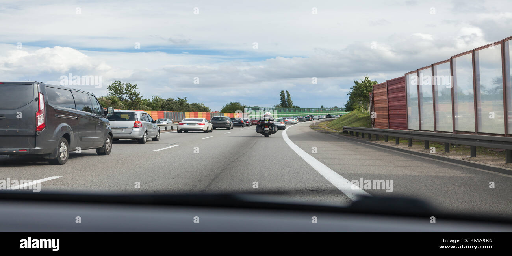

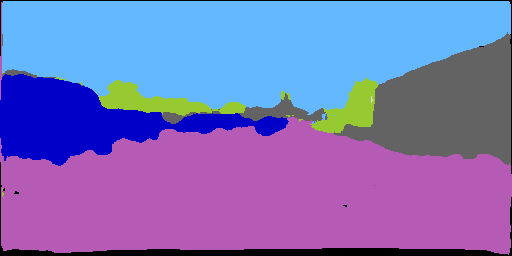

In [53]:
perso = keras.preprocessing.image.load_img("photo-prise-de-l-interieur-de-la-voiture-a-la-route-2e3kacw.jpg",target_size=(256,512))

perso = keras.preprocessing.image.img_to_array(perso)

perso = sm.get_preprocessing(backbone_name)(perso)

perso_pred = unet_resnet34_aug_cw.predict(np.array([perso]))[0]

print(perso_pred.shape)

perso_pred = cats_colors[np.argmax(perso_pred, axis=2)]

print(perso_pred.shape)

display(keras.preprocessing.image.array_to_img(perso))
display(keras.preprocessing.image.array_to_img(perso_pred))

1/1 [==============================] - 1s 1s/step


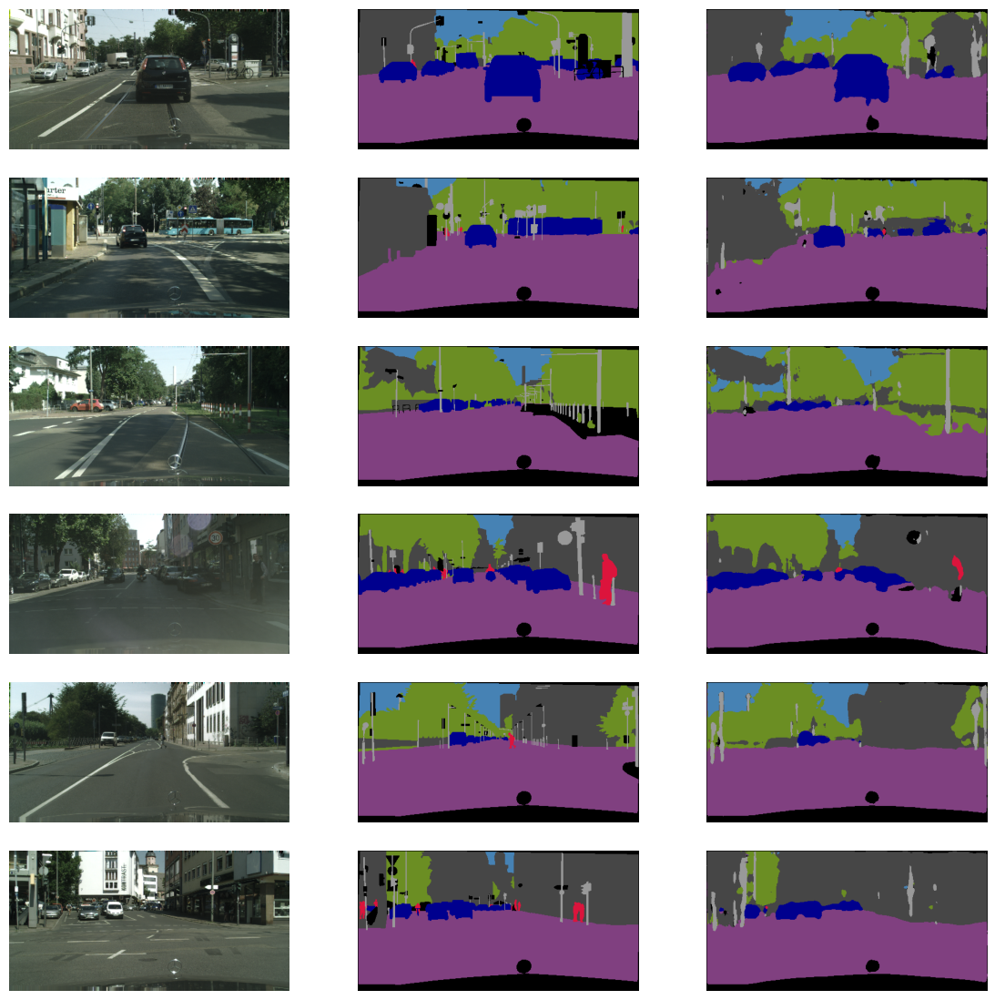

In [54]:
mf.testModel(model=unet_resnet34_aug_cw, test_gen=test_gen, n_images=6, cats_colors=cats_colors, random_state=16)

In [55]:
del unet_resnet34_aug_cw
import gc
gc.collect()

72177

# Exporter le modèle pour l'API

Pour la mise en production du modèle, nous allons utiliser plus de données pour l'entraînement et enregistrer le modèle au format TFLite :

## Entraîner sur plus de données

In [56]:
# use custom class "generator"

# backbone
backbone_name = 'resnet34'

# WITH augmentations for training
train_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    n_images=None,
    cats=cats,
    backbone = backbone_name,
    augmentation=A.Compose(list_of_transforms),
    shuffle=True
)

valid_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=None,
    cats=cats,
    backbone = backbone_name,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_train",
    split_rs=same_random_state
)


test_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="val",
    n_images=None,
    cats=cats,
    backbone = None,
    augmentation=None,
    shuffle=False,
    split=True,
    split_test_size=same_test_size,
    split_keep="split_test",
    split_rs=same_random_state
)


In [57]:
input_shape = train_gen[0][0][0].shape
classes = len(cats)
activation = "softmax"
learning_rate = 0.001
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

# this time, use class_weights based on results
dice_loss_cw = sm.losses.DiceLoss(class_weights=class_weights)
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss_cw = dice_loss_cw + (1 * focal_loss)

jaccard = sm.metrics.IOUScore(threshold=0.5)
dice = sm.metrics.FScore()
metrics = [jaccard, dice]


unet_resnet34_prod = sm.Unet(
    backbone_name=backbone_name,
    input_shape=input_shape,
    classes=classes,
    activation=activation
)

unet_resnet34_prod.compile(
    optimizer=optimizer,
    loss=total_loss_cw,
    metrics=metrics
)

unet_resnet34_prod.summary()



Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 data (InputLayer)           [(None, 256, 512, 3)]        0         []                            
                                                                                                  
 bn_data (BatchNormalizatio  (None, 256, 512, 3)          9         ['data[0][0]']                
 n)                                                                                               
                                                                                                  
 zero_padding2d_102 (ZeroPa  (None, 262, 518, 3)          0         ['bn_data[0][0]']             
 dding2D)                                                                                         
                                                                                            

In [58]:
reboot = False
continue_fitting = False

In [59]:

if ("resnet34_prod.h5" in os.listdir("mySaves/models")) and reboot == False :
    unet_resnet34_prod.load_weights("mySaves/models/resnet34_prod.h5")
    training_time = load("mySaves/training_times/resnet34_prod_training_time.joblib")

if ("resnet34_prod.h5" not in os.listdir("mySaves/models")) or (reboot == True) or (continue_fitting == True) :

   # define callback
   callbacks = [
      keras.callbacks.EarlyStopping(monitor="val_iou_score", patience=3, mode="max", restore_best_weights=True, start_from_epoch=10)
   ]

   start = time.time()
   
   unet_resnet34_prod.fit(
        x=train_gen,
        steps_per_epoch=len(train_gen),
        epochs=100,
        validation_data=valid_gen,
        callbacks=callbacks
    )
   
   training_time = time.time() - start
   
   unet_resnet34_prod.save_weights("mySaves/models/resnet34_prod.h5")
   dump(training_time,"mySaves/training_times/resnet34_prod_training_time.joblib")



In [60]:
scores = unet_resnet34_prod.evaluate(test_gen)

4/4 [==============================] - 19s 4s/step - loss: 0.9129 - iou_score: 0.7487 - f1-score: 0.8278


## Sauvegarder au format TfLite

In [61]:
# create a folder to save our lite model
if not os.path.isdir("Patin_Clement_2_API_042024/TFLite"):
    os.mkdir("Patin_Clement_2_API_042024/TfLite")

In [62]:
if ("resnet34_prod.tflite" not in os.listdir("Patin_Clement_2_API_042024/TfLite")) :
    # save with tf_lite
    converter = tf.lite.TFLiteConverter.from_keras_model(unet_resnet34_prod)
    # to avoid error
    converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]
    converter._experimental_lower_tensor_list_ops = False
    # convert
    tflite_model = converter.convert()
    # save
    with open("Patin_Clement_2_API_042024/TfLite"+"/resnet34_prod.tflite", 'wb') as f:
        f.write(tflite_model)

In [63]:
# save backbone name
if "backbone_name.txt" not in os.listdir("Patin_Clement_3_application_Flask_042024/static") :
    with open("Patin_Clement_3_application_Flask_042024/static/backbone_name.txt", "w+") as f :
        f.write(backbone_name)

## Enregistrer des images pour le test de l'API

In [64]:
# save some images for the Flask web app

n_images = 10

# create folders to save images and masks
if not os.path.isdir("Patin_Clement_3_application_Flask_042024/static/test_images"):
    os.mkdir("Patin_Clement_3_application_Flask_042024/static/test_images")
if not os.path.isdir("Patin_Clement_3_application_Flask_042024/static/test_masks"):
    os.mkdir("Patin_Clement_3_application_Flask_042024/static/test_masks")
if not os.path.isdir("Patin_Clement_3_application_Flask_042024/static/predicted_mask"):
    os.mkdir("Patin_Clement_3_application_Flask_042024/static/predicted_mask")

# random seed
np.random.seed(seed=3)

# pick one batch
some_batch_index = np.random.choice(np.arange(len(test_gen)), size = 1)[0]
some_batch = test_gen[some_batch_index]
# pick n_images idx from this batch
some_batch_examples_idx = np.random.choice(np.arange(len(some_batch[0])), size = n_images)
some_images = np.array([some_batch[0][i] for i in some_batch_examples_idx])
some_masks = np.array([some_batch[1][i] for i in some_batch_examples_idx])

# get class label for each pixel then put them in a channel
some_masks = np.argmax(some_masks, axis=3)
# change colors
color_map = np.array([
    [  0,   0,   0],
    [128,  64, 128],
    [ 70,  70,  70],
    [153, 153, 153],
    [107, 142,  35],
    [ 70, 130, 180],
    [220,  20,  60],
    [  0,   0, 142]
    ])

some_masks = color_map[some_masks]

# 
for i in range(len(some_images)) :
    keras.utils.save_img(path = "Patin_Clement_3_application_Flask_042024/static/test_images/"+str(i+1)+".png", x = some_images[i])
    keras.utils.save_img(path = "Patin_Clement_3_application_Flask_042024/static/test_masks/"+str(i+1)+".png", x = some_masks[i])

## Tester une prédiction

In [65]:
# load model interpreter form TfLite folder
interpreter_loaded = tf.lite.Interpreter(model_path="Patin_Clement_2_API_042024/TfLite/resnet34_prod.tflite")

In [66]:
backbone_name="resnet34"

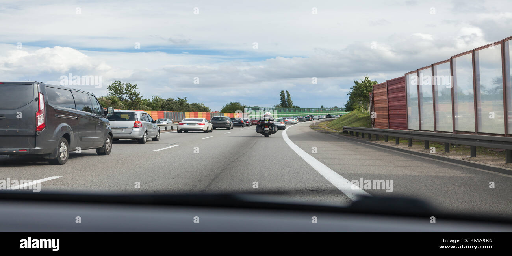

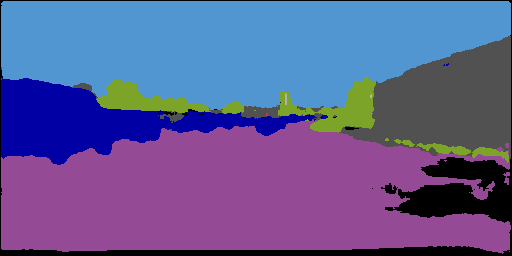

In [67]:
image = keras.preprocessing.image.load_img("photo-prise-de-l-interieur-de-la-voiture-a-la-route-2e3kacw.jpg",target_size=(256,512))

image = keras.preprocessing.image.img_to_array(image)

image = sm.get_preprocessing(backbone_name)(image)

image = tf.image.resize(image, size=(256, 2*256))
image = tf.expand_dims(image, axis=0)

# cast to float32 (default tflite dtype)
image = tf.cast(image, dtype='float32')

# get interpreter input and output details
input_details = interpreter_loaded.get_input_details()
output_details = interpreter_loaded.get_output_details()

# # resize interpreter input
# interpreter.resize_tensor_input(
#     input_index=input_details[0]["index"], 
#     tensor_size=[len(X),text_vectorizer.output_shape[1]]
#     )
# allocate
interpreter_loaded.allocate_tensors()
# predict scores
interpreter_loaded.set_tensor(tensor_index=input_details[0]["index"],value=image)
interpreter_loaded.invoke()

predicted_scores = interpreter_loaded.get_tensor(output_details[0]['index'])[0]

# pick the predicted class for each pixel and apply our color mapping
predicted_mask = cats_colors[np.argmax(predicted_scores, axis=-1)]

display(keras.preprocessing.image.array_to_img(image[0]))
display(keras.preprocessing.image.array_to_img(predicted_mask))

# Tests augmentations

In [68]:
raw_gen = mf.generator(
    batch_size=batch_size,
    images_path='P8_Cityscapes_leftImg8bit_trainvaltest/leftImg8bit/', 
    masks_path='P8_Cityscapes_gtFine_trainvaltest/gtFine/',
    image_size=(256, 256*2),
    which_set="train",
    cats=cats,
    backbone=None,
    augmentation=None,
    shuffle=True
)

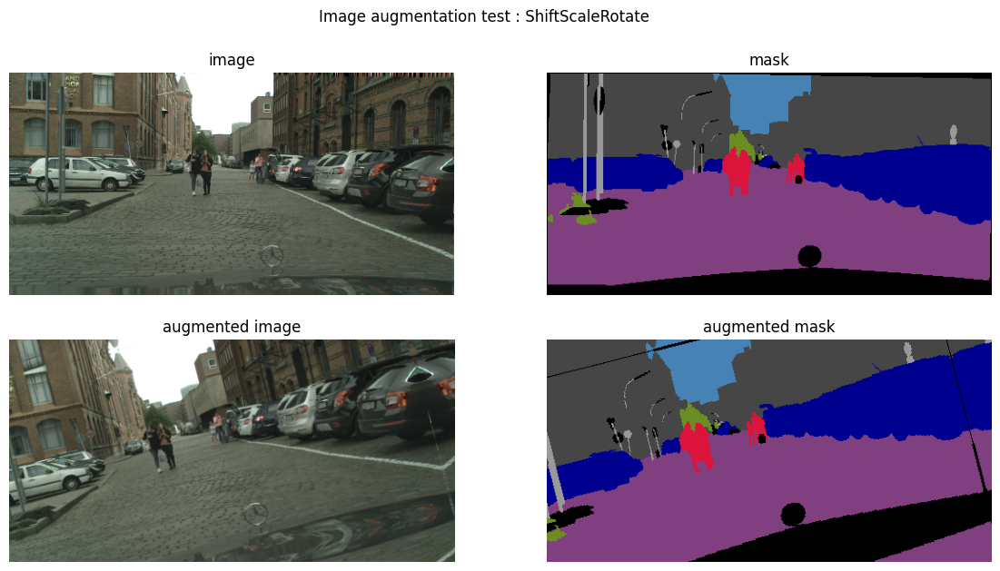

In [69]:
mf.testAlbu(
    raw_gen,
    trans=[A.ShiftScaleRotate(
        shift_limit=0.1,
        scale_limit=0.1,
        rotate_limit=30,
        p=1,
    )],
    idx=3,
    cats_colors=cats_colors,
    trans_name="ShiftScaleRotate"
)

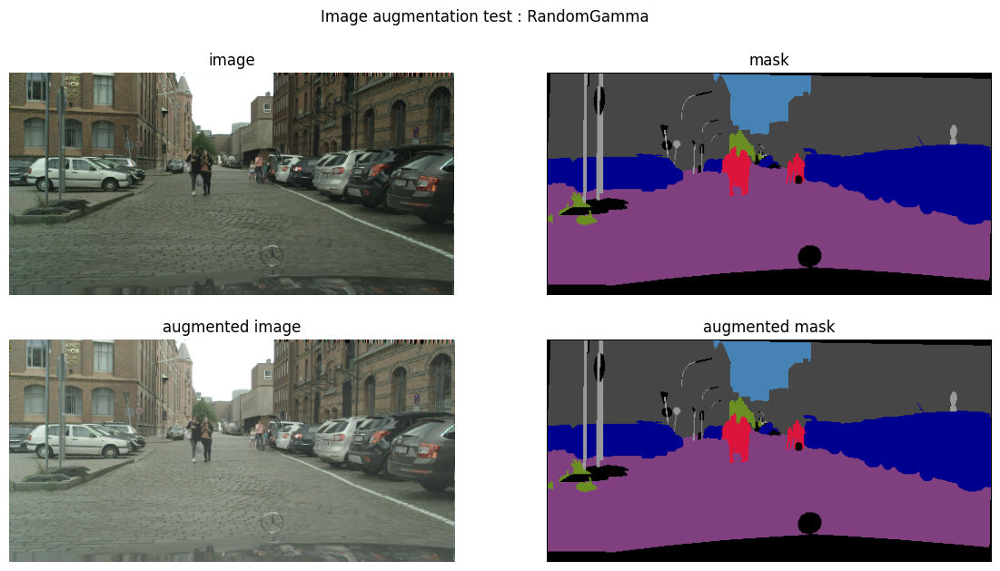

In [70]:
mf.testAlbu(
    raw_gen,
    [A.RandomGamma(p=1, gamma_limit=(10, 200))
        ],
    idx=3,
    cats_colors=cats_colors,
    trans_name="RandomGamma"
)

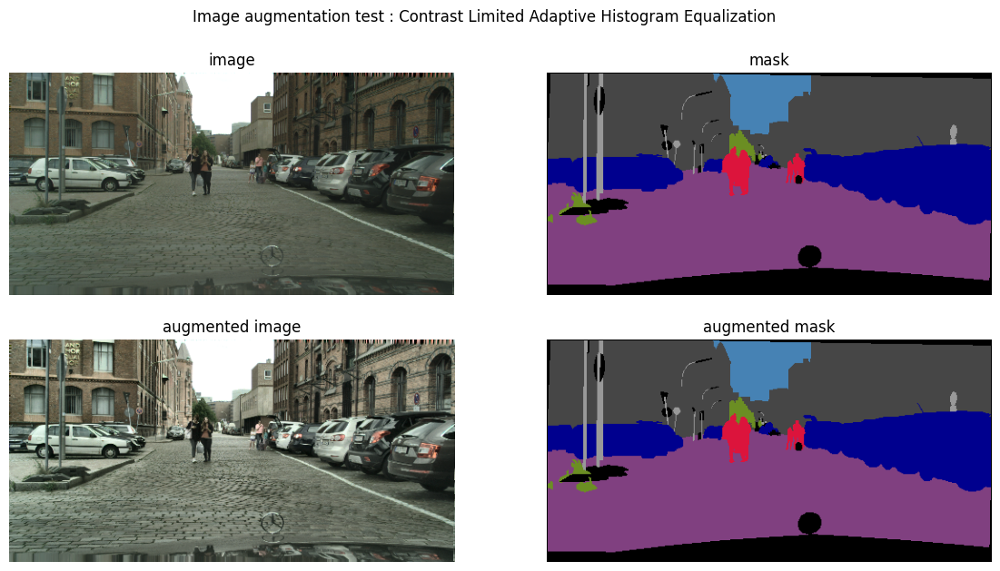

In [71]:
mf.testAlbu(
    raw_gen,
    [A.CLAHE(p=1, clip_limit=6)],
    idx=3,
    cats_colors=cats_colors,
    trans_name="Contrast Limited Adaptive Histogram Equalization"
)

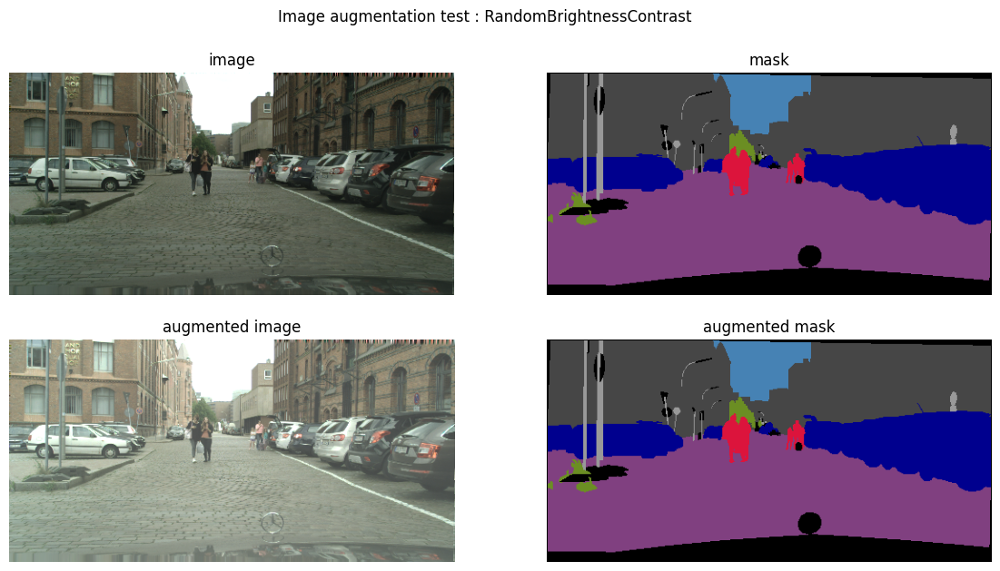

In [72]:
mf.testAlbu(
    raw_gen,
    [A.RandomBrightnessContrast(p=1, brightness_limit=0.3, contrast_limit=0.3)],
    idx=3,
    cats_colors=cats_colors,
    trans_name="RandomBrightnessContrast"
)

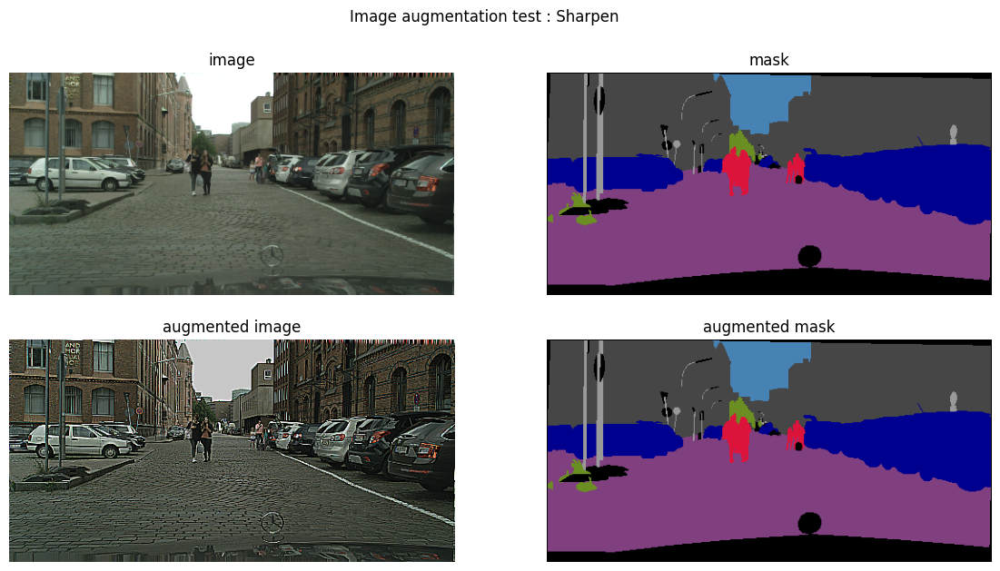

In [73]:
mf.testAlbu(
    raw_gen,
    [A.Sharpen(p=1, alpha=(0.3,0.7), lightness=(0.5,1.0))],
    idx=3,
    cats_colors=cats_colors,
    trans_name="Sharpen"
)

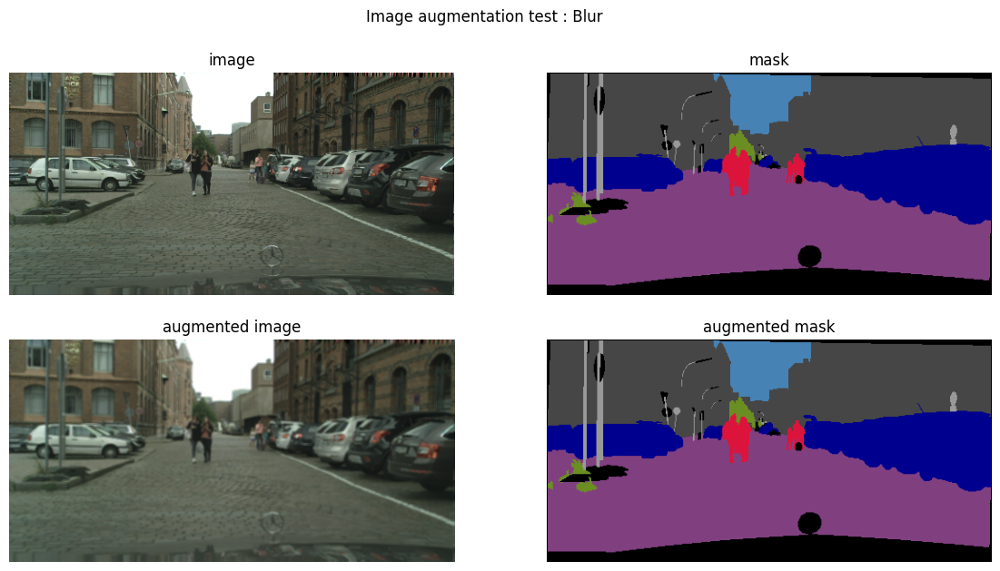

In [74]:
mf.testAlbu(
    raw_gen,
    [A.Blur(p=1, blur_limit=9)],
    idx=3,
    cats_colors=cats_colors,
    trans_name="Blur"
)

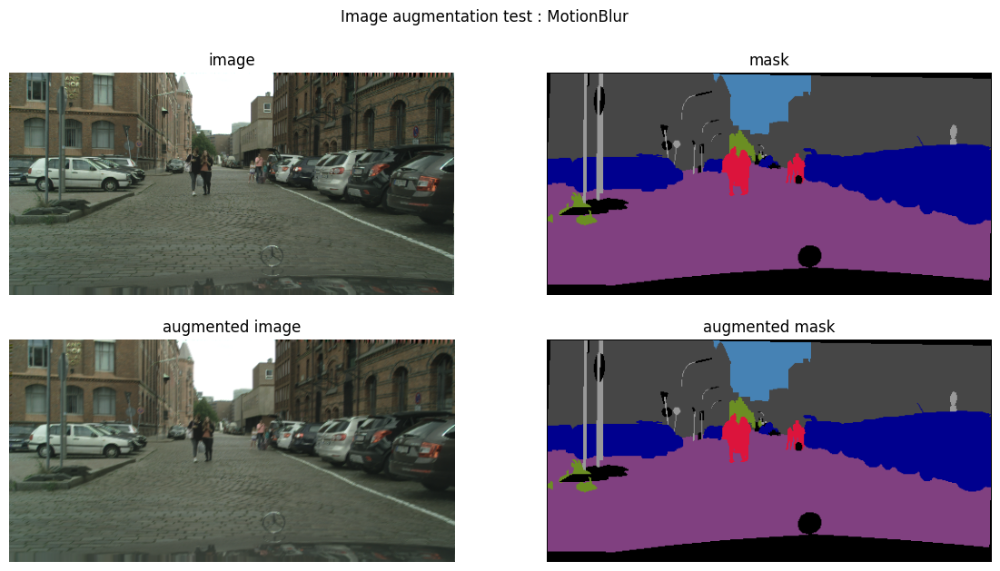

In [75]:
mf.testAlbu(
    raw_gen,
    [A.MotionBlur(p=1, blur_limit=9)],
    idx=3,
    cats_colors=cats_colors,
    trans_name="MotionBlur"
)

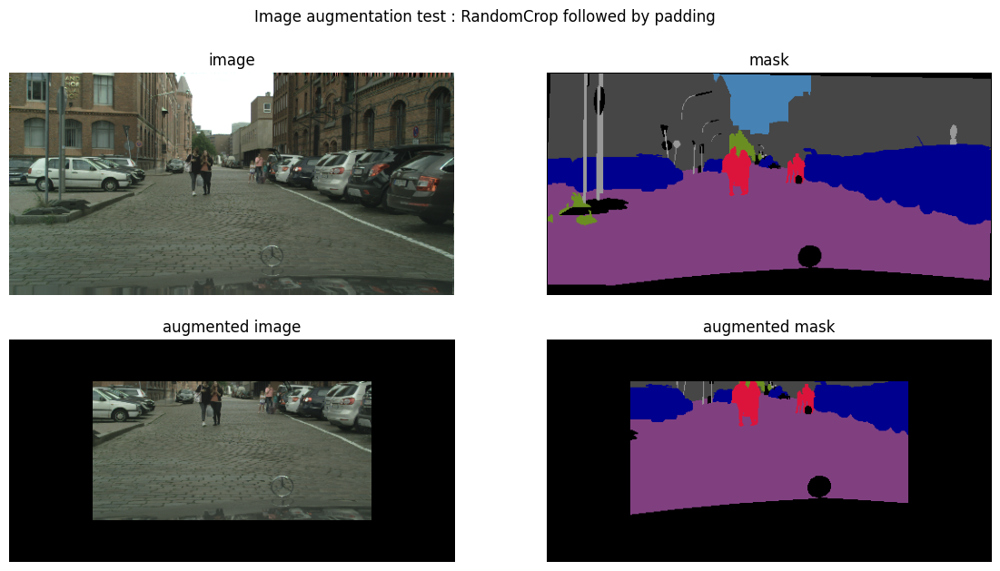

In [76]:
mf.testAlbu(
    raw_gen,
    [A.RandomCrop(
        height=160,
        width=160*2,
        p=1
    ),
    A.PadIfNeeded(
        min_height=256,
        min_width=512,
        border_mode = 0,
        p=1
    )],
    idx=3,
    cats_colors=cats_colors,
    trans_name="RandomCrop followed by padding"
)

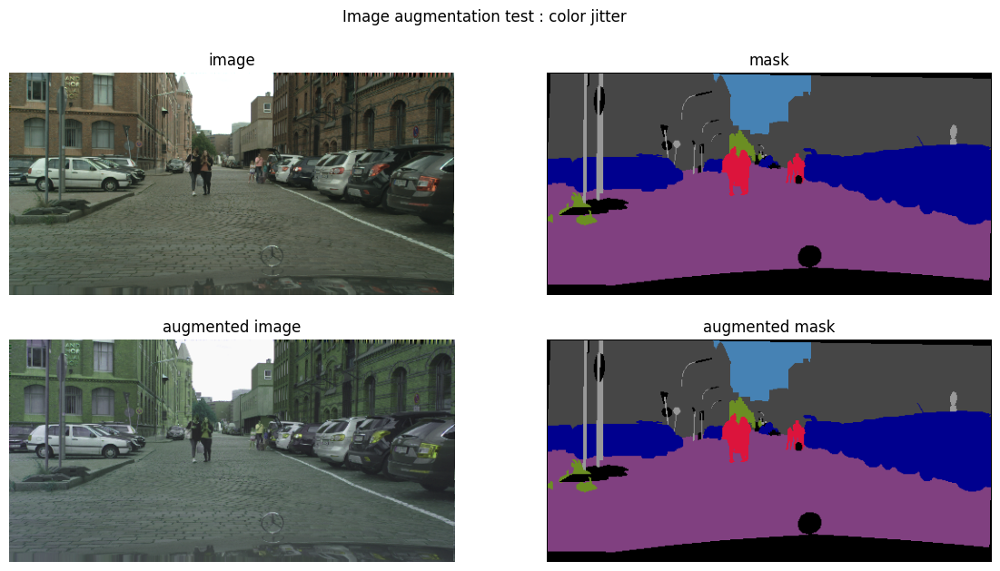

In [77]:
mf.testAlbu(raw_gen, 
         [A.ColorJitter(p=1, brightness=0.2, contrast=0.2, saturation=0.2)], 
         idx = 3,
         cats_colors=cats_colors,
         trans_name="color jitter")

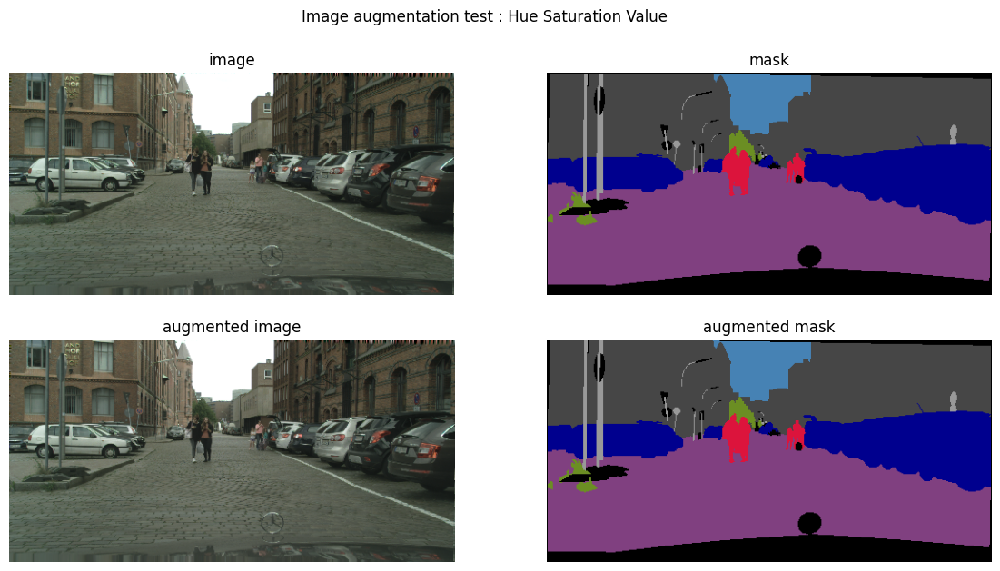

In [78]:
mf.testAlbu(raw_gen, 
         [A.HueSaturationValue(p=1, hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20)], 
         idx = 3,
         cats_colors=cats_colors,
         trans_name="Hue Saturation Value")

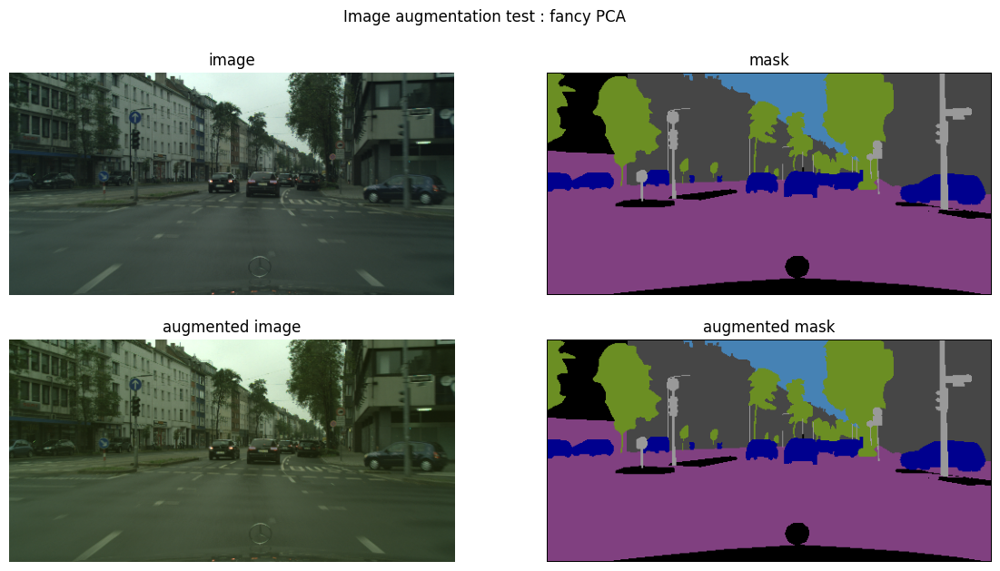

In [79]:
mf.testAlbu(raw_gen, 
         [A.FancyPCA(p=1, alpha=1)], 
         idx = 1,
         cats_colors=cats_colors,
         trans_name="fancy PCA")

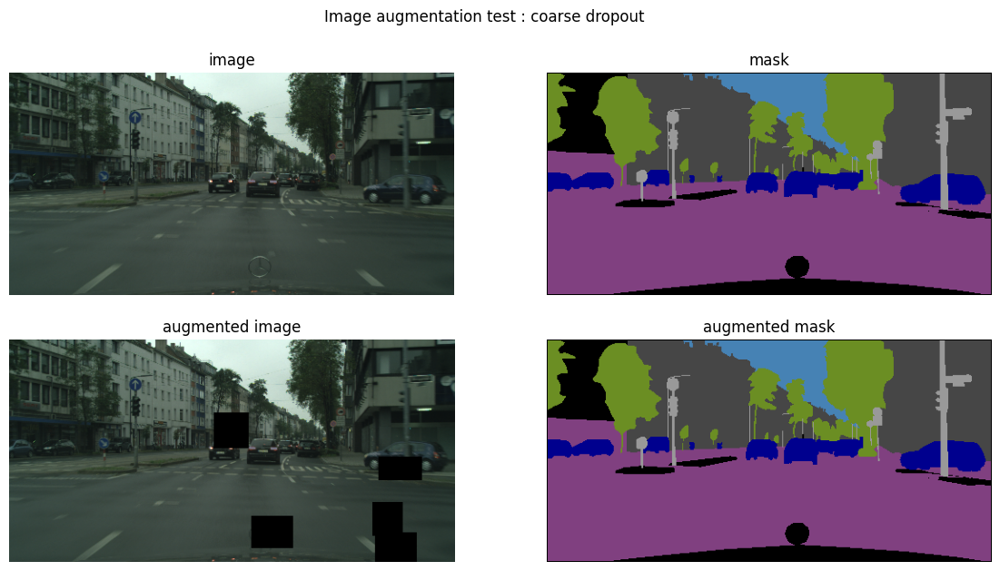

In [80]:
mf.testAlbu(raw_gen, 
         [A.CoarseDropout(p=1, min_holes=2, max_holes=8, min_height=0.1, max_height=0.2, min_width=0.05, max_width=0.1)], 
         idx = 1,
         cats_colors=cats_colors,
         trans_name="coarse dropout")

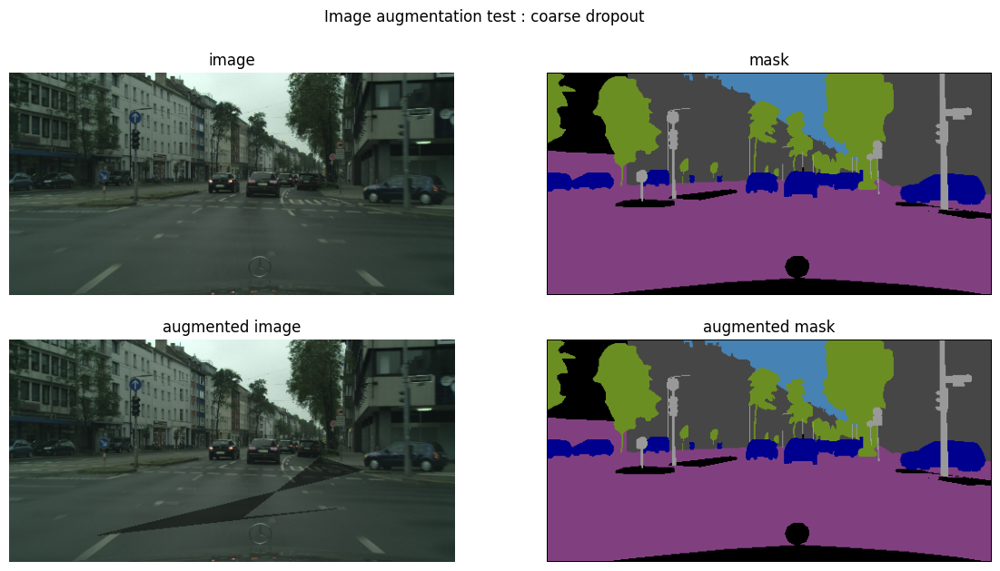

In [81]:
mf.testAlbu(raw_gen, 
         [A.RandomShadow(p=1, shadow_roi=(0,0.4,1,1), num_shadows_lower=1, num_shadows_upper=4, shadow_dimension=5)], 
         idx = 1,
         cats_colors=cats_colors,
         trans_name="coarse dropout")

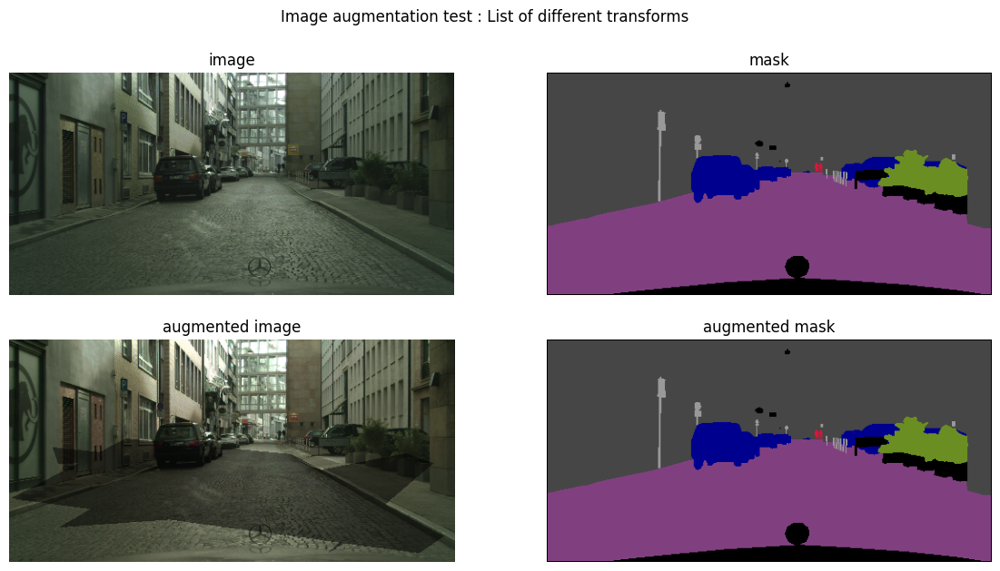

In [82]:
mf.testAlbu(raw_gen, 
         list_of_transforms, 
         idx = 23,
         cats_colors=cats_colors,
         trans_name="List of different transforms")

# TEST API

In [83]:
import requests

API_URL = "http://localhost:8000"

headers = {"accept" : "application/json"}

files=[
    ('img',('1.png', open('Patin_Clement_3_application_Flask_042024/static/test_images/1.png', 'rb'), 'image/png'))
]

response = requests.post(url = API_URL+"/predict", headers=headers,  files=files).json()

ConnectionError: HTTPConnectionPool(host='localhost', port=8000): Max retries exceeded with url: /predict (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x000002B2187079D0>: Failed to establish a new connection: [WinError 10061] Aucune connexion n’a pu être établie car l’ordinateur cible l’a expressément refusée'))

In [ ]:
# display(keras.preprocessing.image.array_to_img(image[0]))
import json
image = json.loads(response["mask"])

display(keras.preprocessing.image.array_to_img(image))